# Seattle AirBnB Data Analysis 
## A notebook Containing analysis of AirBnB Data for Seattle for 2016

In [1]:
# Import libraries for analysis
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import calendar
import seaborn as sns
%matplotlib inline

# Business Understanding
## What are the questions you are interested in tackling.
### Monthly Number of listings and their average price/night?
### What is the average price/night in the neighbourhood?
### Which variables have a strong relationship with the price of listings?¶

# Data Understanding - Gather and analyze the data available.


In [2]:
# Read in datasets

calendar = pd.read_csv('calendar.csv')
listings = pd.read_csv('listings.csv')
reviews = pd.read_csv('reviews.csv')

## Data Assesment

In [3]:
# Look at each dataset to get a feel of the data
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [4]:
#Data types for each of the columns present in the calendar file
calendar.dtypes

listing_id     int64
date          object
available     object
price         object
dtype: object

In [5]:
#Total Columns and rows in the Calendar data 
calendar.shape

(1393570, 4)

In [6]:
#Exploring listing data
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [7]:
listings.dtypes

id                                    int64
listing_url                          object
scrape_id                             int64
last_scraped                         object
name                                 object
                                     ...   
cancellation_policy                  object
require_guest_profile_picture        object
require_guest_phone_verification     object
calculated_host_listings_count        int64
reviews_per_month                   float64
Length: 92, dtype: object

In [8]:
#Total Columns and rows in the listing data 
listings.shape

(3818, 92)

In [9]:
#Exploring review data
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,7202016,38917982,2015-07-19,28943674,Bianca,Cute and cozy place. Perfect location to every...
1,7202016,39087409,2015-07-20,32440555,Frank,Kelly has a great room in a very central locat...
2,7202016,39820030,2015-07-26,37722850,Ian,"Very spacious apartment, and in a great neighb..."
3,7202016,40813543,2015-08-02,33671805,George,Close to Seattle Center and all it has to offe...
4,7202016,41986501,2015-08-10,34959538,Ming,Kelly was a great host and very accommodating ...


In [10]:
reviews.dtypes

listing_id        int64
id                int64
date             object
reviewer_id       int64
reviewer_name    object
comments         object
dtype: object

In [11]:
#Total Columns and rows in the listing data 
reviews.shape

(84849, 6)

# Prepare Data
## EDA, Cleaning etc...

In [12]:
# Missing values in any rows or columns
print(calendar.isnull().any())
print()
print(listings.isnull().any())
print()
print(reviews.isnull().any())

listing_id    False
date          False
available     False
price          True
dtype: bool

id                                  False
listing_url                         False
scrape_id                           False
last_scraped                        False
name                                False
                                    ...  
cancellation_policy                 False
require_guest_profile_picture       False
require_guest_phone_verification    False
calculated_host_listings_count      False
reviews_per_month                    True
Length: 92, dtype: bool

listing_id       False
id               False
date             False
reviewer_id      False
reviewer_name    False
comments          True
dtype: bool


In [13]:
# Check datatypes and make the necessary changes
# Convert price into float
calendar['price'] = calendar['price'].str.replace(',', '')
calendar['price'] = calendar['price'].str.replace('$', '')
calendar['price'] = calendar['price'].astype(float)
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,85.0
1,241032,2016-01-05,t,85.0
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


In [14]:
# Convert Nan prices into 0 price
calendar['price'].fillna(0, inplace=True)
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,85.0
1,241032,2016-01-05,t,85.0
2,241032,2016-01-06,f,0.0
3,241032,2016-01-07,f,0.0
4,241032,2016-01-08,f,0.0


In [15]:
# Convert column 'available' to a true boolean
calendar['available'] = calendar['available'] == 't'

In [16]:
calendar['available'].value_counts()

True     934542
False    459028
Name: available, dtype: int64

In [17]:
#calendar['date'].min()
#calendar['date'].max()

# Convert column 'date' to a true datetype
calendar['date'] = pd.to_datetime(calendar['date'])

In [18]:
#Inspect the updated data types
calendar.dtypes

listing_id             int64
date          datetime64[ns]
available               bool
price                float64
dtype: object

## Exploratory Data Analysis

In [19]:
df = calendar.groupby('listing_id')

In [20]:
# Total revenue for all rooms for the year
calendar['price'].sum()

128915264.0

In [21]:
# Total occupancy ratio for the year
round(calendar['available'].mean()*100,1)

67.1

In [22]:
# Average price per night for the year
df['price'].mean().mean()

92.50720380031136

In [23]:
# Total number of accomodation listings
calendar.shape[0]/365

3818.0

In [24]:
# Average revenue per listing for the year
avg_annual_revenue = round(calendar['price'].sum()/ (calendar.shape[0]/365),0)
avg_annual_revenue

33765.0

In [25]:
# Extract neighbourhood information from listings dataframe
list = listings[['id','neighbourhood_group_cleansed']]
list.head()

,id,neighbourhood_group_cleansed
0,241032,Queen Anne
1,953595,Queen Anne
2,3308979,Queen Anne
3,7421966,Queen Anne
4,278830,Queen Anne


In [26]:
# Accomodation listings split by neighbourhood
list['neighbourhood_group_cleansed'].value_counts()

Other neighborhoods    794
Capitol Hill           567
Downtown               530
Central Area           369
Queen Anne             295
Ballard                230
West Seattle           203
Rainier Valley         159
University District    122
Beacon Hill            118
Cascade                 89
Northgate               80
Delridge                79
Lake City               67
Magnolia                61
Seward Park             44
Interbay                11
Name: neighbourhood_group_cleansed, dtype: int64

In [27]:
# Rename neighbourhood column
list = list.rename(index=str, columns={"id": "listing_id", "neighbourhood_group_cleansed":"neighbourhood"})
list.head()

,listing_id,neighbourhood
0,241032,Queen Anne
1,953595,Queen Anne
2,3308979,Queen Anne
3,7421966,Queen Anne
4,278830,Queen Anne


In [28]:
# Merge calendar and list dataframes into new_df
new_df = pd.merge(calendar, list, on=['listing_id', 'listing_id'])

In [29]:
# Check data types are OK
new_df.dtypes

listing_id                int64
date             datetime64[ns]
available                  bool
price                   float64
neighbourhood            object
dtype: object

In [30]:
new_df['neighbourhood'] = new_df['neighbourhood'].astype('category')

# Shorten 'other neighbourhoods' to 'other' for length in visualizations
new_df['neighbourhood'] = new_df['neighbourhood'].replace('Other neighborhoods','Other')

In [31]:
# Check changes
new_df[new_df['neighbourhood'] == 'Other'].head()

,listing_id,date,available,price,neighbourhood
102200,314180,2016-01-04,False,0.0,Other
102201,314180,2016-01-05,False,0.0,Other
102202,314180,2016-01-06,False,0.0,Other
102203,314180,2016-01-07,False,0.0,Other
102204,314180,2016-01-08,False,0.0,Other


In [32]:
# List of months and days of weeks for visualizations
month_list=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
week_list=['Mon','Tue','Wed','Thu','Fri','Sat','Sun']

## What are the questions you are interested in tackling

### Monthly Number of listings and their average price/night?

In [45]:
new_df_bkp = new_df.copy()
#new_df = new_df_bkp.copy()

In [34]:
new_df['month'] = new_df['date'].dt.strftime('%m')
new_df['year'] = new_df['date'].dt.strftime('%y')

In [35]:
# Filtering for available rooms in each month
new_df1 = new_df[(new_df.available == True)]

In [61]:
#Monthly Number of listings

number_of_listings = new_df1.groupby(new_df1['date'].dt.strftime('%m'))['listing_id'].nunique()
number_of_listings = pd.DataFrame(number_of_listings).reset_index()
number_of_listings['date'] = number_of_listings.replace(['01','02','03','04','05','06','07','08','09','10','11','12'], month_list)

#Plot bar chart for better visulization 
import plotly.express as px
fig = px.bar(number_of_listings, x='date', y='listing_id',
             labels={'listing_id':'Number of Listings','date':"Month of the Year"})
fig.show()

fig.write_image("fig1.png")

In [62]:
#Plot bar chart for better visulization 
import plotly.express as px
fig = px.histogram(new_df1, x="price",nbins= 60)

fig.show()
fig.write_image("fig2.png")

In [66]:
#average price of listing

new_df1['price'].mean()

137.94485855103355

In [63]:
#Monthly average price per night
avg_price_per_night = new_df1.groupby(new_df1['date'].dt.strftime('%m'))['price'].mean()
avg_price_per_night = pd.DataFrame(avg_price_per_night).reset_index()
avg_price_per_night['date'] = avg_price_per_night.replace(['01','02','03','04','05','06','07','08','09','10','11','12'], month_list)

#Plot bar chart for better visulization 
import plotly.express as px
fig = px.bar(avg_price_per_night, x='date', y='price',
            labels={'price':'Average Price($)','date':"Month of the Year"})
fig.show()

fig.write_image("fig3.png")

### What is the average price/night in the neighbourhood?

In [64]:
# Average price per night by neighbourhood sorted top to bottom
neighbourhood = new_df1.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).reset_index()

#Plot bar chart for better visulization 
import plotly.express as px
fig = px.bar(neighbourhood, x='neighbourhood', y='price',
            labels={'price':'Average Price Per Night($)','neighbourhood':"Neighborhood"})
fig.show()

fig.write_image("fig4.png")

In [55]:
# Average price per night for each month alphabetically
hood_avg_price_per_month = round(new_df1.groupby('neighbourhood')['price'].mean(),2)
hood_avg_price_per_month = pd.DataFrame(hood_avg_price_per_month).reset_index()
hood_avg_price_per_month

,neighbourhood,price
0,Ballard,125.91
1,Beacon Hill,100.67
2,Capitol Hill,134.67
3,Cascade,154.03
4,Central Area,134.88
5,Delridge,90.93
6,Downtown,187.34
7,Interbay,118.42
8,Lake City,94.52
9,Magnolia,198.69


### Which variables have a strong relationship with the price of listings?

In [41]:
new_listing_df = listings.copy()

new_listing_df['price'] = new_listing_df['price'].str.replace(',', '')
new_listing_df['price'] = new_listing_df['price'].str.replace('$', '')
new_listing_df['price'] = new_listing_df['price'].astype(float)

new_listing_df = new_listing_df[new_listing_df.applymap(np.isreal)] # extract only numeric columns 
new_listing_df.dropna(how = "all", axis = 1, inplace = True)
# It still has nan values so, I have to replace these values with np.nan. These nan vlaues will be removed after that.

new_listing_df.replace(["NaN"], np.nan, inplace = True)
new_listing_df = new_listing_df.dropna()
new_listing_df = new_listing_df.drop(['id','scrape_id','host_id'], axis=1) #Just remove useless columns

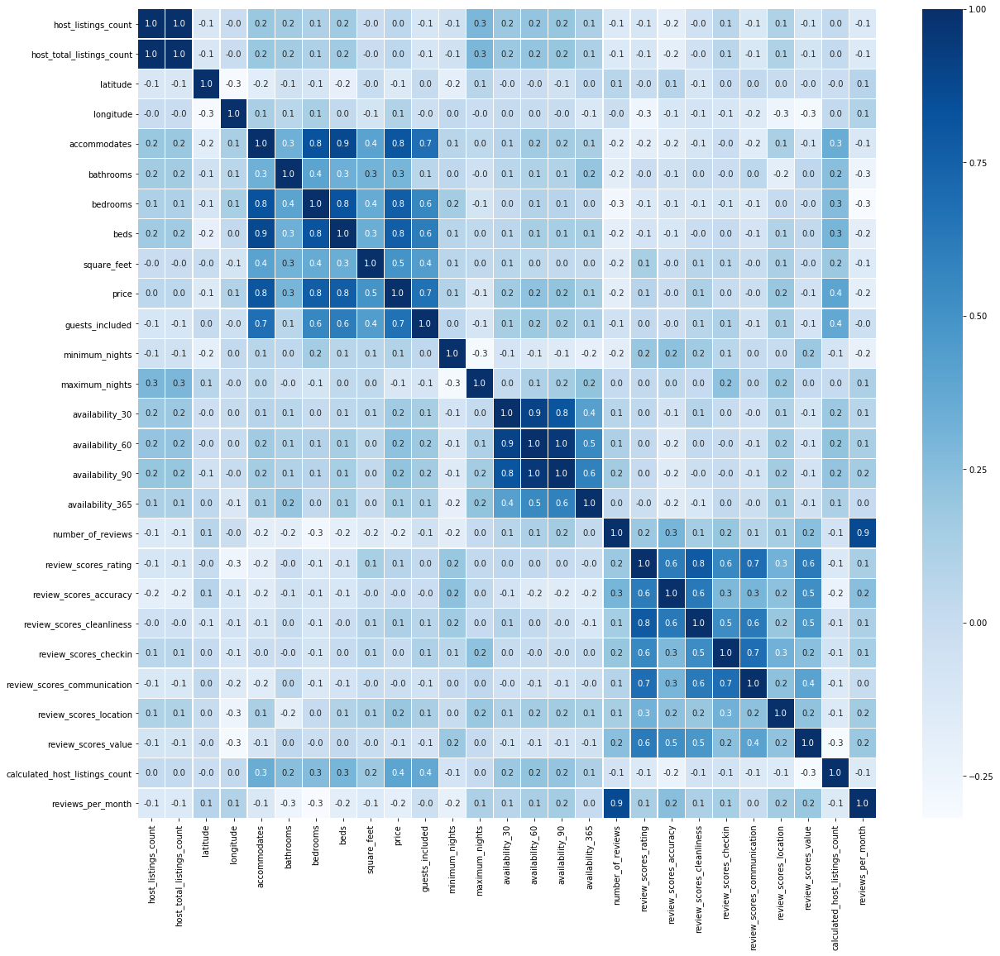

In [44]:
f,ax = plt.subplots(figsize=(20,18))
#ax.set_ylim(sorted(ax.get_xlim(), reverse=True))
sns.heatmap(new_listing_df.corr(), annot=True, linewidths=.2, fmt= '.1f',ax=ax,cmap='Blues') 
plt.savefig('Corr')
plt.show()

#correlation with price 
#1.accomodation 2.bedrooms 3.beds 4.guests_included 5.sqaure_feet 6. bathrooms 7. calculated_host_listings_count